In [1]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn

import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
import cv2
import model.vit_better as vit_custom
import os

/usr/local/lib/python3.10/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
img_size = 224
patch_size = 16
dropout = 0.1

num_classes=100

In [3]:
model = vit_custom.VisionTransformer(img_size=img_size, 
                        patch_size=patch_size, 
                        num_classes=num_classes, 
                        dropout=dropout,
                        embed_dim=768,
                        num_layers=12,
                        num_heads=12,
                        mlp_ratio=4.,
                        estimate_params=True)
# model.load_state_dict(torch.load('./model/last_sports.pth'))
model.load_state_dict(torch.load('./model/better_model.pth'))
model.head = nn.Linear(768, num_classes)
model.float()

VisionTransformer(
  (patch_embed): PatchEmbedding(
    (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  )
  (pos_embed): PositionalEmbedding(
    (norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (transformer_encoders): ModuleList(
    (0-11): 12 x TransformerEncoderLayer(
      (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (ls1): LayerScale()
      (ls2): LayerScale()
      (drop_path): Identity()
      (attn): MHA(
        (fc_qkv): Linear(in_features=768, out_features=2304, bias=True)
        (fc_o): Linear(in_features=768, out_features=768, bias=True)
        (q_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (k_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (attn_drop): Dropout(p=0.1, inplace=False)
        (proj_drop): Dropout(p=0.1, inplace=False)
      )
      (mlp): Sequential(
        (0): Linear(in_featur

In [4]:


attentions = {}  # 모델의 각 레이어에서의 attention 값을 저장할 딕셔너리

def get_attn_softmax(name):
    """ 주어진 레이어 이름에 대해 모델의 forward pass 중 attention 값을 추출하여 저장하는 hook 함수를 정의합니다. """
    def hook(model, input, output):
        with torch.no_grad():  # 그래디언트 계산을 비활성화
            input = input[0]
            B, N, C = input.shape  # 입력 텐서의 차원을 가져옵니다 (Batch, Number of tokens, Channels)
            # QKV(Query, Key, Value)를 계산합니다
            qkv = (
                model.fc_qkv(input)
                .detach()
                .reshape(B, N, 3, model.n_heads, C // model.n_heads)
                .permute(2, 0, 3, 1, 4)
            )
            
            q, k, v = qkv.unbind(0)  # QKV를 각각 분리합니다
            q = q * model.scale  # Query에 scale을 적용합니다
            attn = q @ k.transpose(-2, -1)  # Attention 점수를 계산합니다
            attn = attn.softmax(dim=-1)  # Softmax를 적용하여 정규화합니다
            
            attentions[name] = attn  # 계산된 attention 값을 저장합니다
    return hook

# ViT 모델에 대한 주의력 시각화 훅을 추가하는 함수
def add_attn_vis_hook(model):
    """ ViT 모델의 각 transformer encoder 레이어에 주의력 시각화를 위한 hook을 추가합니다. """
    for idx, module in enumerate(list(model.transformer_encoders.children())):
        module.attn.register_forward_hook(get_attn_softmax(f"attn{idx}"))  # 각 attention 레이어에 hook을 등록합니다

def get_mask(im, att_mat):
    """ 주어진 attention 매트릭스를 기반으로 마스크를 생성하고 이미지에 적용합니다. """
    # 모든 헤드에 걸쳐 attention 가중치를 평균합니다
    att_mat = torch.mean(att_mat, dim=1)

    # 잔여 연결을 고려하여, attention 매트릭스에 identity 매트릭스를 더하고 재정규화합니다
    residual_att = torch.eye(att_mat.size(1))
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # 가중치 매트릭스를 재귀적으로 곱합니다
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
        
    # 출력 토큰에서 입력 공간으로의 주의력을 표현합니다
    v = joint_attentions[-1]
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")
    return result, joint_attentions, grid_size

def show_attention_map(model, img_path, shape):
    """ 모델과 이미지 경로를 받아 해당 이미지에 대한 주의 맵을 시각화합니다. """
    add_attn_vis_hook(model)  # 모델에 주의력 시각화 훅을 추가합니다
    im = Image.open(os.path.expandvars(img_path))  # 이미지를 열고
    im = im.resize((shape, shape))  # 주어진 크기로 조정합니다
    
    # 이미지 변환을 정의합니다 (텐서로 변환하고 정규화)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])

    logits = model(transform(im).unsqueeze(0))  # 모델에 이미지를 입력하고 로짓을 얻습니다

    attn_weights_list = list(attentions.values())  # 추출된 attention 값들을 가져옵니다

    result, joint_attentions, grid_size = get_mask(im, torch.cat(attn_weights_list))  # 마스크를 생성합니다

    # 결과를 시각화하기 위한 준비
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Attention Map')
    _ = ax1.imshow(im)
    _ = ax2.imshow(result)

    # 모델 예측과 주의 맵을 출력합니다
    probs = torch.nn.Softmax(dim=-1)(logits)
    top5 = torch.argsort(probs, dim=-1, descending=True)
    print("Prediction Label and Attention Map!\n")
    for idx in top5[0, :5]:
        print(f'{probs[0, idx.item()]:.5f} : {idx.item()}', end='')

    # 각 레이어별로 주의 맵을 생성하고 시각화합니다
    for i, v in enumerate(joint_attentions):
        mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
        mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
        result = (mask * im).astype("uint8")

        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
        ax1.set_title('Original')
        ax2.set_title(f'Attention Map_{i+1} Layer')
        _ = ax1.imshow(im)
        _ = ax2.imshow(result)
    
    plt.show()  # 시각화된 결과를 표시합니다

Prediction Label and Attention Map!

0.01617 : 50.01433 : 340.01367 : 980.01294 : 590.01277 : 61

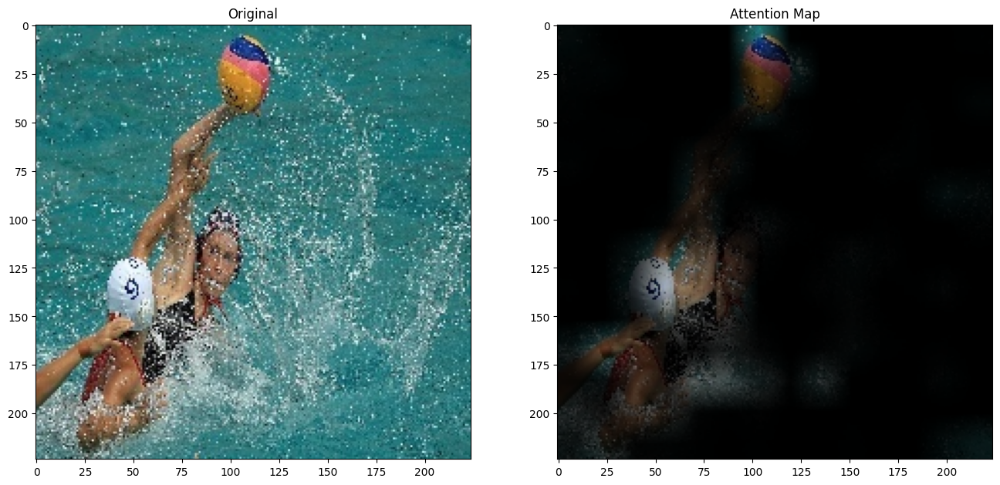

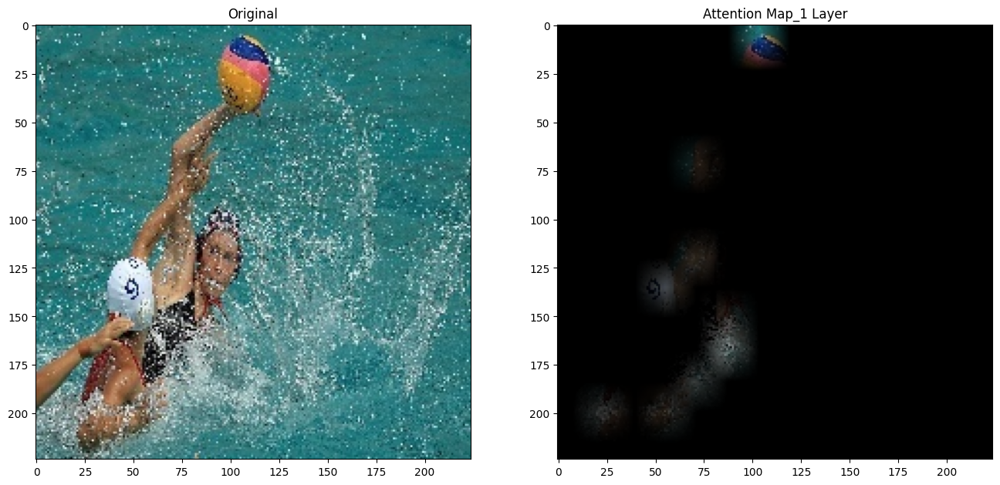

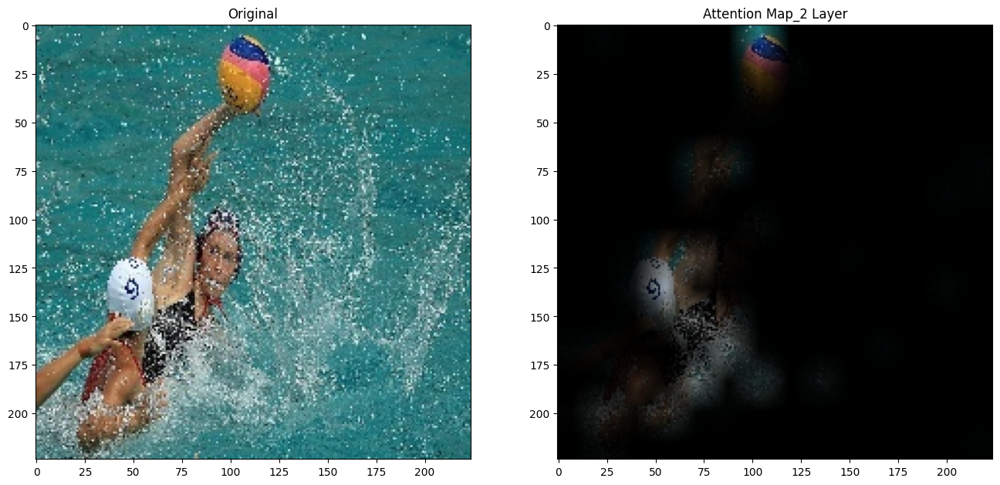

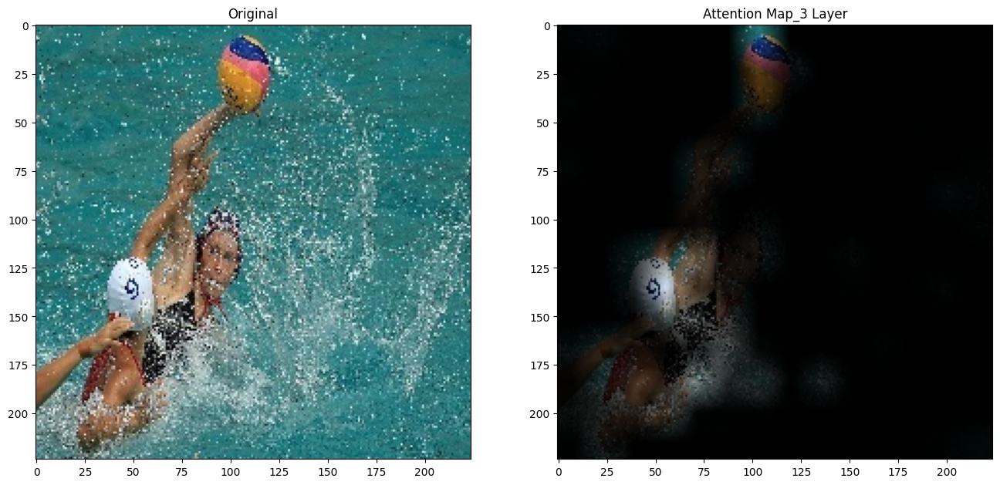

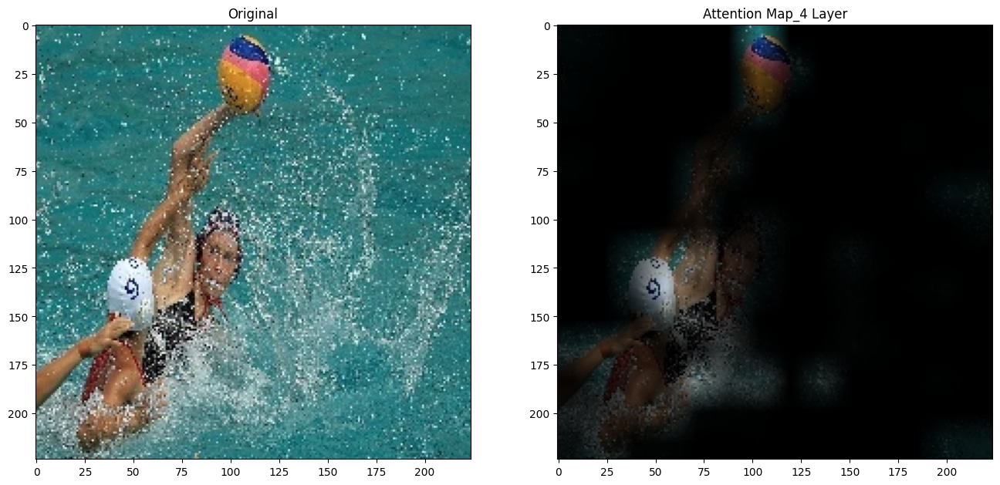

...

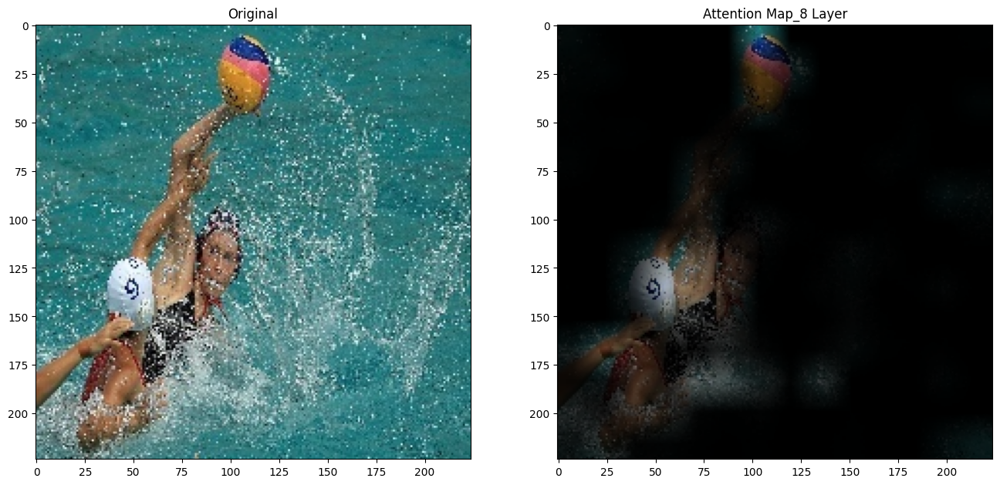

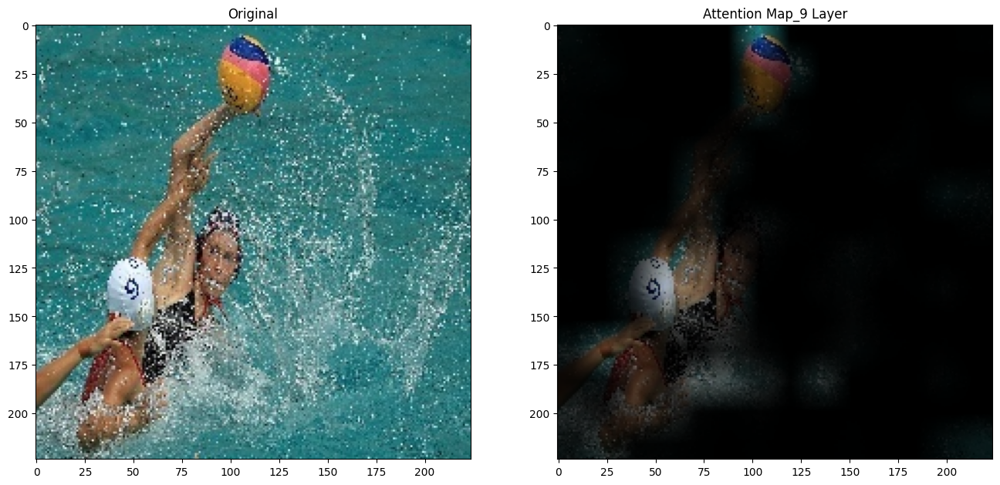

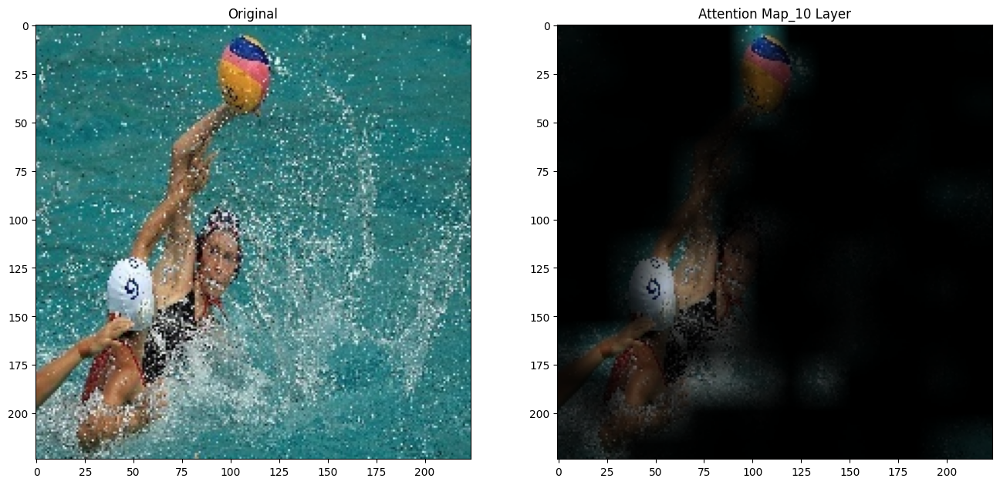

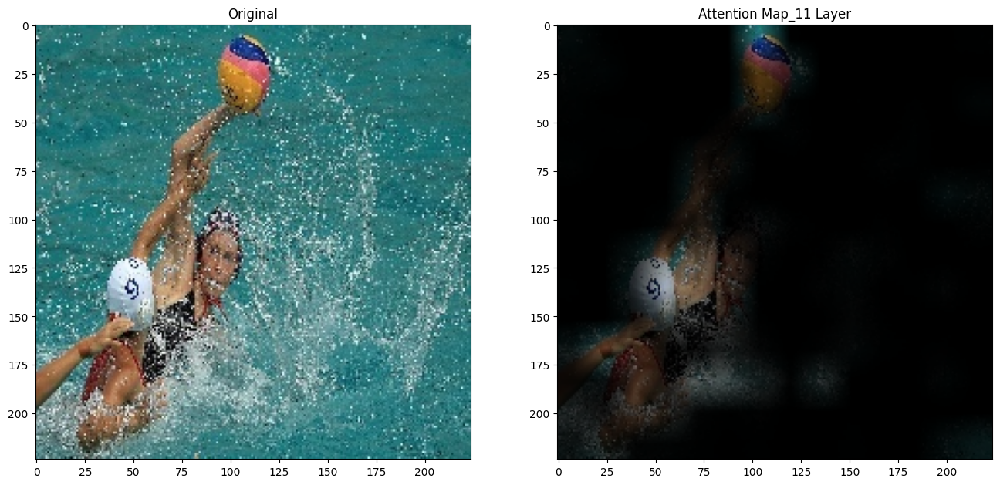

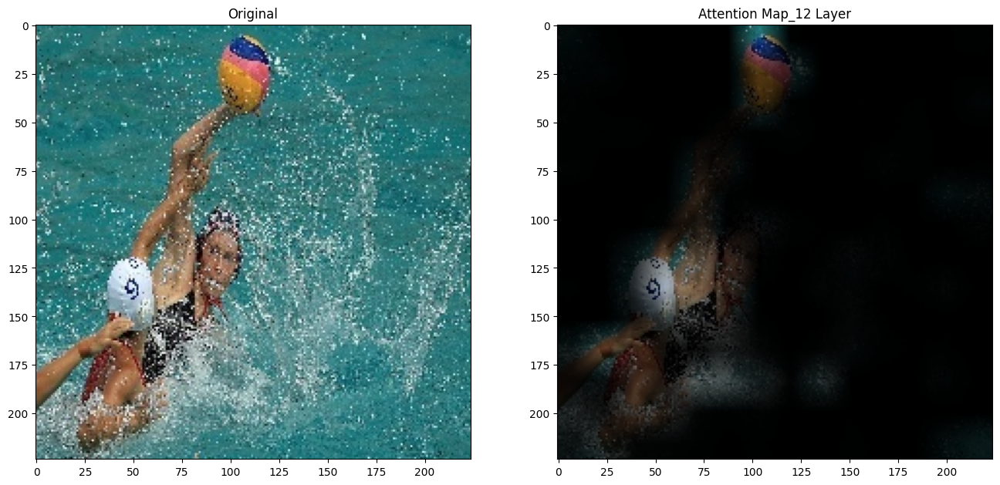

In [5]:
show_attention_map(model, '/root/study/algorithm/03.ViT/data/sports/train/water polo/001.jpg', 224)

Prediction Label and Attention Map!

0.01411 : 720.01368 : 420.01346 : 130.01263 : 670.01257 : 21

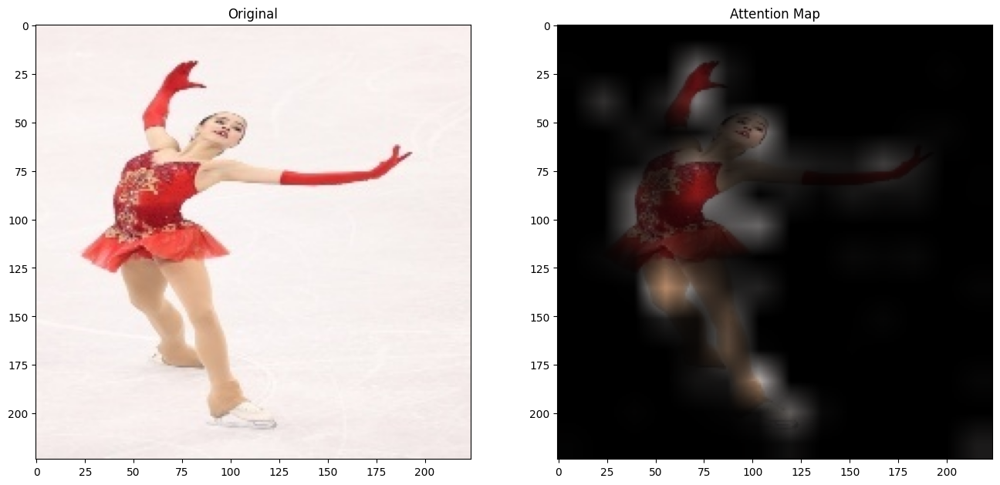

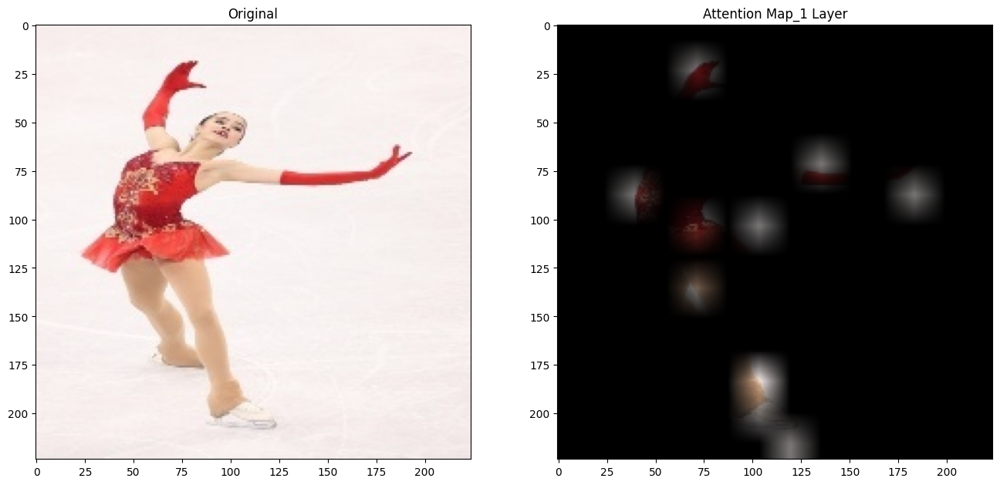

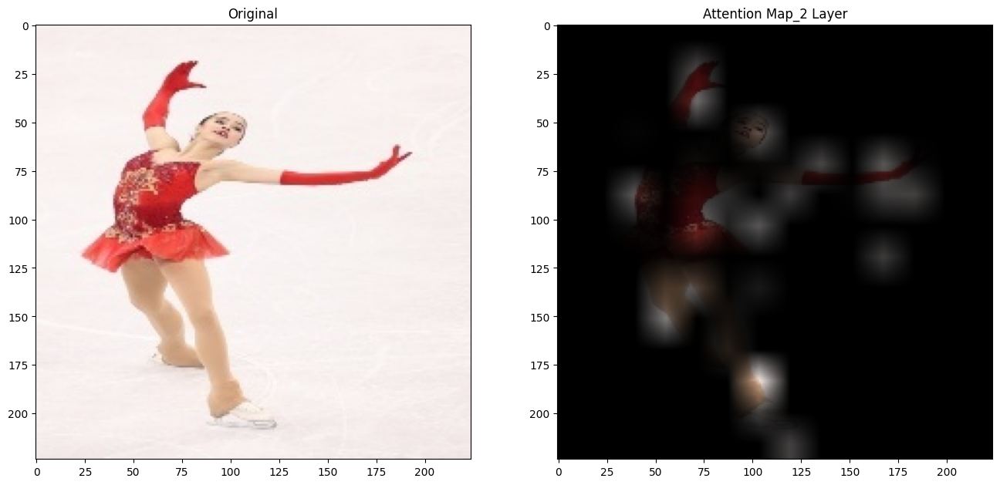

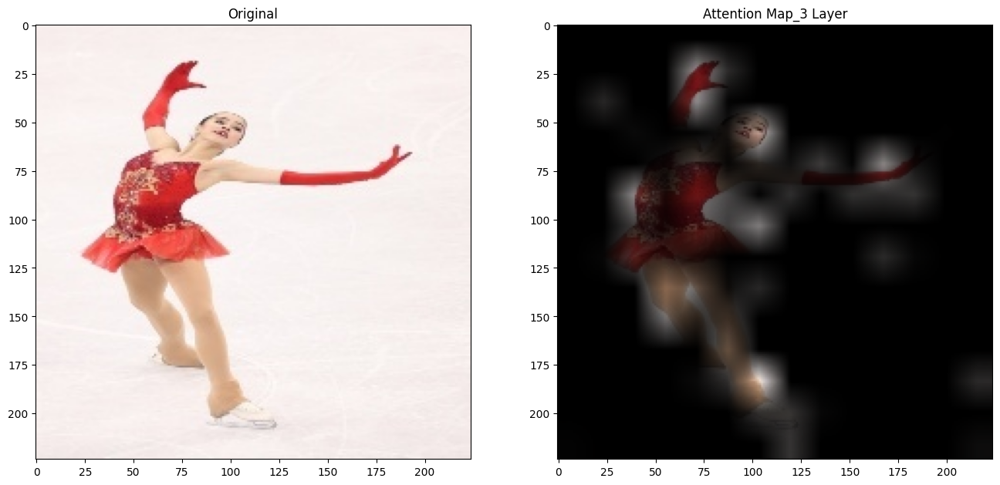

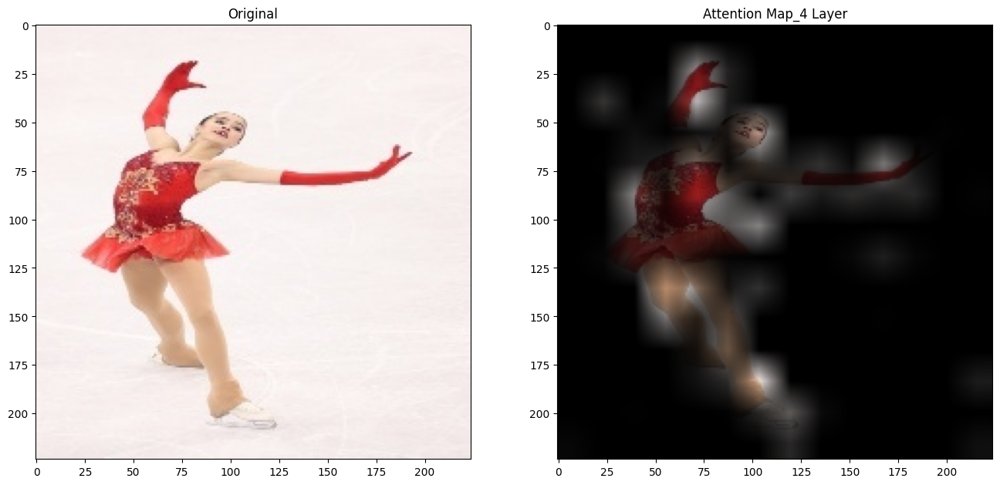

...

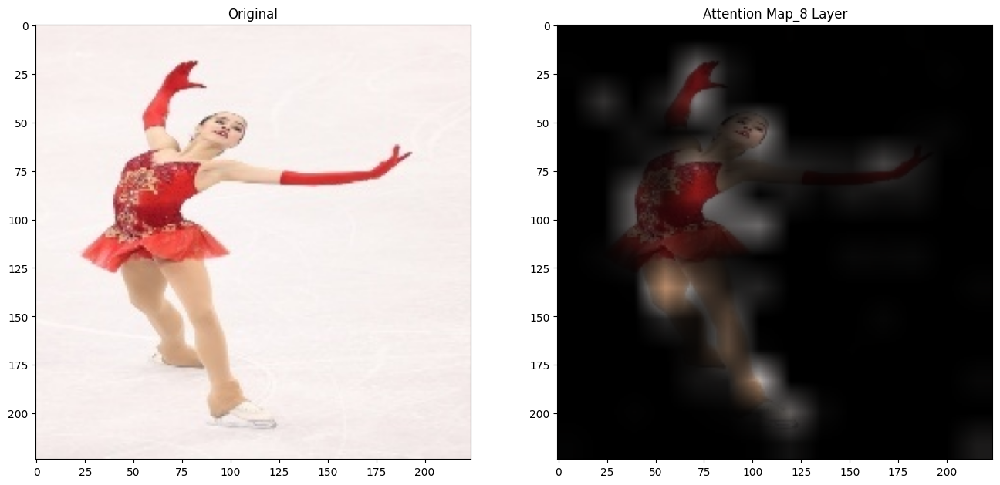

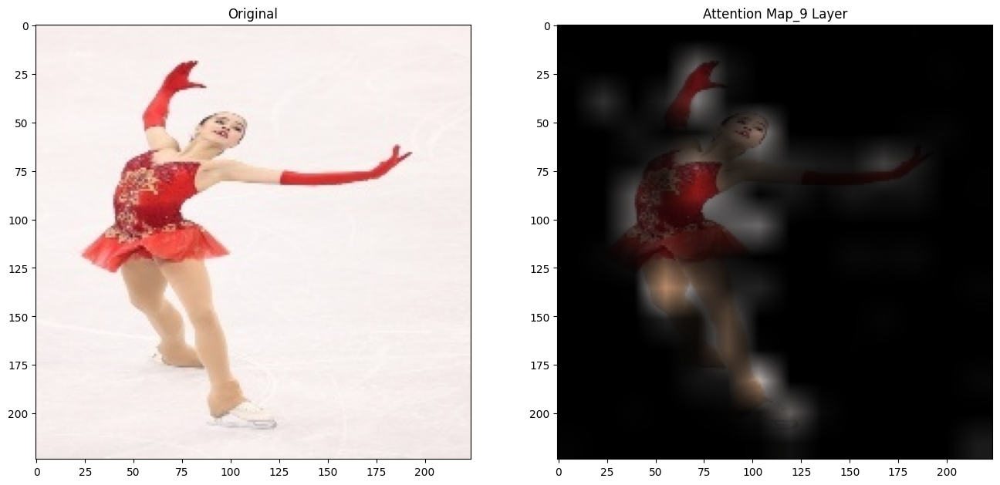

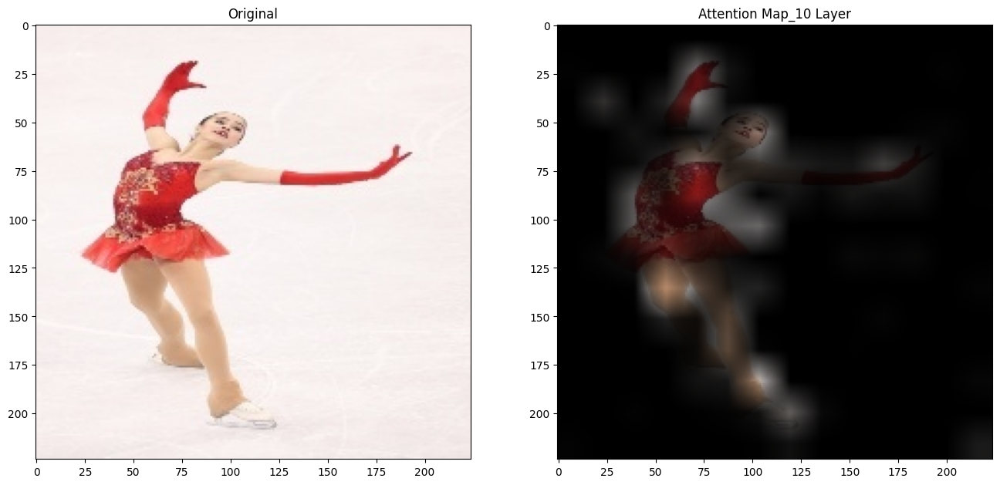

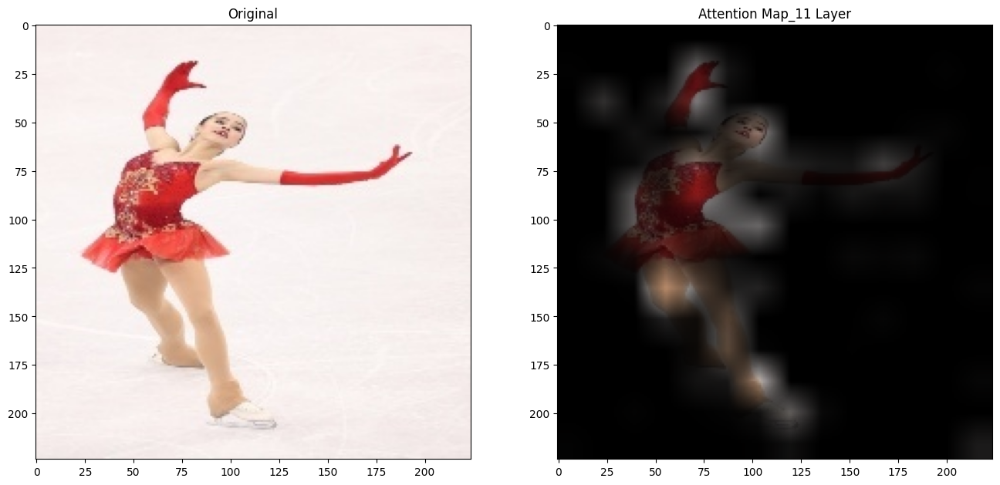

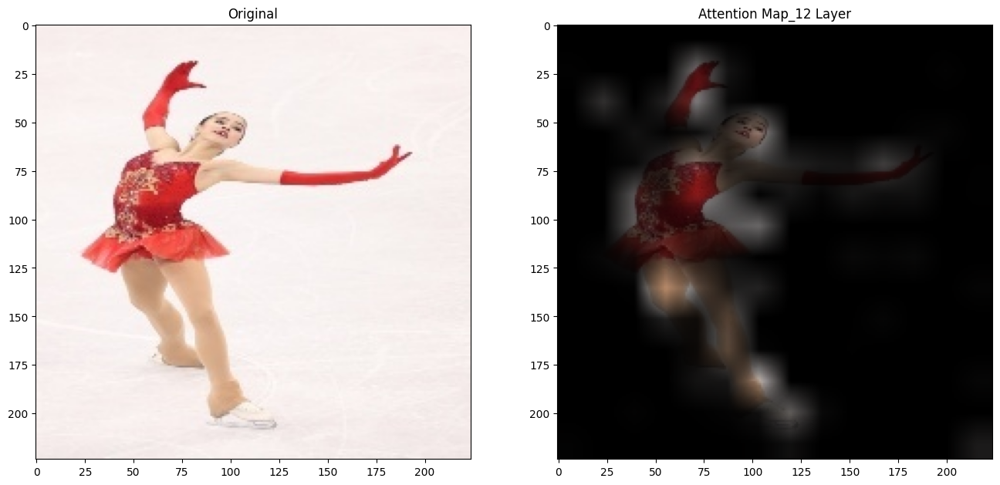

In [12]:
show_attention_map(model, '/root/study/algorithm/03.ViT/data/sports/train/figure skating women/002.jpg', 224)